# Selecting "Target" Genes for Modeling

We start from a curated set of genes, which can typically be composed of genes which are thought to drive a biological process of interest (for example, a set of heart-specific transcription factors in cardiac development), or more generally a set of genes that display interesting patterns of cell type-specificity or spatial enrichment. 

We note that part of this tutorial depends on PyVista for visualization, which is not straightforward on Windows. However, this sections with "Visualization" in the title can be skipped over in this case. 

In [1]:
import anndata
import dynamo as dyn
import spateo as st
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from IPython.display import display, HTML
from PIL import Image

import pyvista as pv
pv.global_theme.transparent_background = False
# For Pyvista plotting in headless environment (Mac, Windows or Linux)
pv.start_xvfb()

2024-08-18 03:19:01.880480: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2024-08-18 03:19:01.917022: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-08-18 03:19:02.540759: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [2]:
np.random.seed(888)

In [3]:
%config InlineBackend.print_figure_kwargs={'dpi': 300.0}

## Tutorial structure

For organizational purposes, we will create three folders within the current working directory, "data", "database", and "analysis". The first will eventually contain the input data, the second will eventually contain the files that constitute Spateo's signaling database, and the third results of analyses and all intermediate files generated along the way. 

In [4]:
# Optionally, change the "working directory" here:
wd = "/home/danielyumengzhu/Spateo-tutorial"

os.chdir(wd)

In [5]:
if not os.path.exists("./data"):
    os.mkdir("./data")

if not os.path.exists("./database"):
    os.mkdir("./database")

if not os.path.exists("./analysis"):
    os.mkdir("./analysis")

## Load data

In this tutorial, we will use data from a mouse embryo at the E11.5 developmental stage, obtained using the Stereo-seq method. Notably, this dataset contains the region of tissue surrounding the Zona Limitans Intrathalamica (ZLI), which is an "organizer" (a tissue structure that plays a role in directing the differentiation of the surrounding tissues). More information about the ZLI and the general factors that characterize the ZLI region can be found here: 

[About the ZLI](https://www.nature.com/articles/nn1338)

This data was reconstructed from multiple consecutive serial slices using our alignment pipeline. A separate tutorial (to introduce the concept) is provided here: 

[Alignment tutorial](https://spateo-release.readthedocs.io/en/latest/tutorials/notebooks/3_alignment.html)

The data can be loaded from the link below. Once downloaded, place into the "data" folder within your current working directory. This dataset focuses on the tissue on the anterior and posterior sides of the ZLI ("E11.5_ZLI"). 

[Mouse Embryo E11.5 ZLI datasets](https://www.dropbox.com/scl/fo/y7pkkonepa6lg9l09hu6i/AB1Ryb6VbElhCn2NKOXgW5Q?rlkey=jxcf34rbib9k324ftb8hn4i76&st=atcg0zve&dl=0)

For this tutorial, we also need access to Spateo's databases. These can be found in the package folder, but they can also be found at the link below. For this tutorial, we will move the database directory to a "database" folder within the current working directory. In the case of downloading from the link, all files (human_GRN.csv, etc.) should be moved into a folder in the working directory with this name. 

[CCI database files](https://www.dropbox.com/scl/fo/dcd95so9zhkb8lnjkkxep/ANwmkFeb-sgtS89leHQezlU?rlkey=saiul4j5rr1vt6lwjl4hirmwh&st=kipotkvm&dl=0)

In [6]:
e115_zli = anndata.read_h5ad("./data/E11.5_ZLI.h5ad")
e115_zli.uns["__type"] = "UMI"

### Visualize both datasets

We can see the positioning of the ZLI structure within both of these data subsets.

In [7]:
if not os.path.exists("./analysis/figures"):
    os.mkdir("./analysis/figures")

In [8]:
import matplotlib as mpl
from matplotlib.colors import LinearSegmentedColormap

if "hot_y" not in mpl.colormaps():
    colors = ["#000000", "#AA0000", "#CC0000", "#FF8800", "#FFFF00"]
    nodes = [0.0, 0.25, 0.5, 0.75, 1.0]
    mpl.colormaps.register(LinearSegmentedColormap.from_list("hot_y", list(zip(nodes, colors))))
    
lscmap = mpl.cm.get_cmap("Reds") # gist_rainbow, rainbow, hsv, tab20
zli_hex_list = [mpl.colors.to_hex(lscmap(i)) for i in np.linspace(0, 1, 2)]
zli_colors = {i: j for i, j in zip(["Others", "Zona limitans intrathalamica"], zli_hex_list)}

In [9]:
e115_zli.obs["ZLI"] = e115_zli.obs["mapped_celltype"].map(lambda x: x if x in ["Zona limitans intrathalamica"] else "Others")

In [10]:
pc_model, _ = st.tdr.construct_pc(
    adata= e115_zli,
    spatial_key = "z_correction",
    groupby = "ZLI",
    key_added = "ZLI", 
    colormap = zli_colors, 
    alphamap = {"Others": 0.4, "Zona limitans intrathalamica": 1}
)

pc_model = st.tdr.rotate_model(model=pc_model, angle=(0, 0, 90), rotate_center= pc_model.center, inplace=False)
pc_model = st.tdr.rotate_model(model=pc_model, angle=(0, 180, 0), rotate_center= pc_model.center, inplace=False)
pc_model = st.tdr.rotate_model(model=pc_model, angle=(30, 0, 0), rotate_center= pc_model.center, inplace=False)

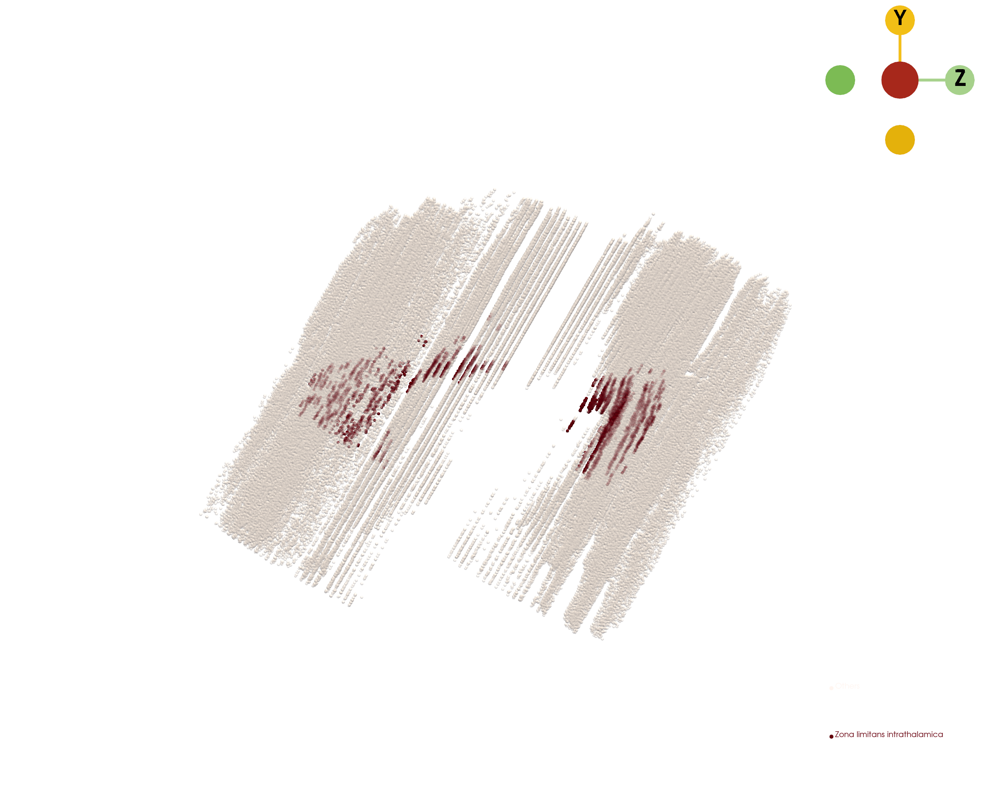

In [11]:
st.pl.three_d_plot(
    model = pc_model,
    key = "ZLI",
    model_style = "points",
    model_size = 8,
    opacity = 1,
    colormap = None,
    show_legend = True,
    jupyter = "static",
    off_screen = False,
    cpo = "zy",
    window_size = (2560, 2048),
    filename = "./analysis/figures/mouse_E11.5_ZLI_angle_1.tiff"
)

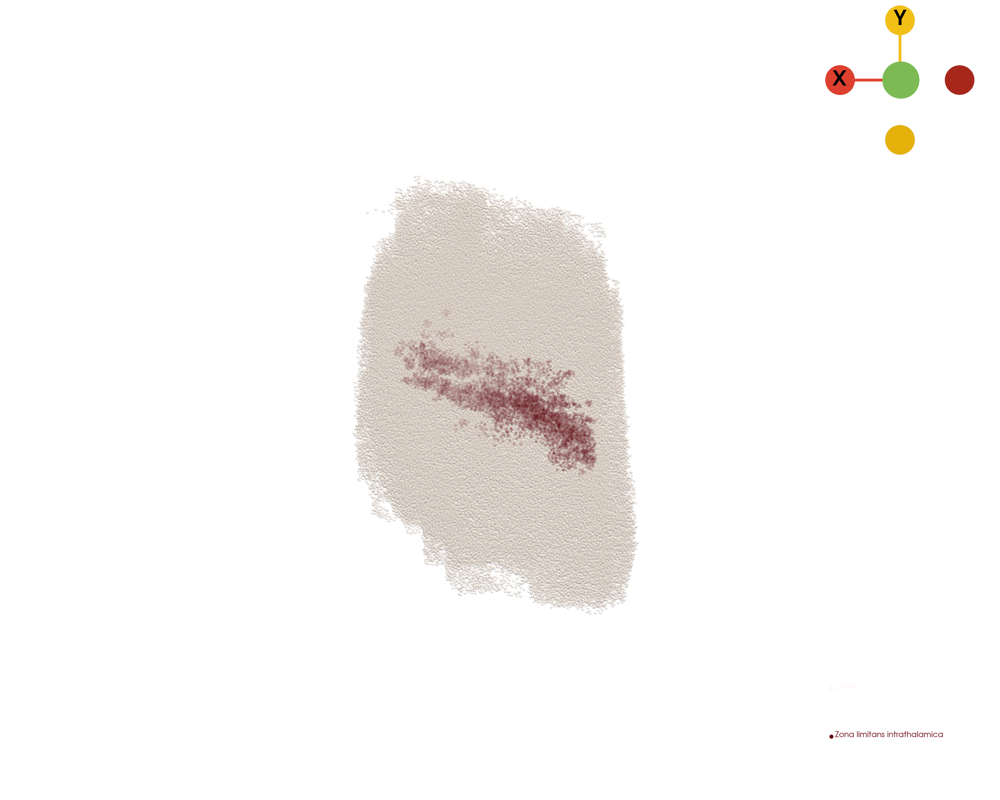

In [12]:
# And in one more angle:
st.pl.three_d_plot(
    model = pc_model,
    key = "ZLI",
    model_style = "points",
    model_size = 8,
    opacity = 1,
    colormap = None,
    show_legend = True,
    jupyter = "static",
    off_screen = False,
    cpo = [(1626, 481, -519), (1612, 481, 647), (0, 1, 0)],
    window_size = (2560, 2048),
    filename = "./analysis/figures/mouse_E11.5_ZLI_angle_2.tiff"
)

## Target gene selection

As mentioned in the introduction section, there are many ways to provide a set of genes for our modeling purposes, from prior biological knowledge or from applying differential gene expression, spatial differential expression, fold change analysis for two conditions, etc. For this tutorial, we will demonstrate one potential method by selecting from genes that display patterns of spatial enrichment along the anterior-posterior axis of the embryo. In doing so, we hope to identify genes that are expressed only on one side of the ZLI (and along the way, include genes which may have interesting sub-region patterns beyond that). To accomplish this, we will leverage the rostral-caudal axis ("RC axis") created using Spateo's digitization algorithm. 

To introduce the concept of digitization, see our other tutorials linked below:

[2D digitization tutorial](https://spateo-release.readthedocs.io/en/latest/tutorials/notebooks/5_cluster_digitization/6_layer_column_digitization.html)

[3D digitization tutorial](https://spateo-release.readthedocs.io/en/latest/tutorials/notebooks/5_cluster_digitization/7_3d_mesh_digitization.html)

We will first apply a linear model to identify genes that significantly change along the RC axis.

Another strategy we have commonly used is to identify genes with significant spatial autocorrelation- this will be demonstrated on a 2D example (coming soon!)

### Visualize RC axis

In [13]:
pc_model, _ = st.tdr.construct_pc(
    adata = e115_zli,
    spatial_key = "z_correction",
    groupby = "rc_coord",
    key_added = "rc_coord"
)

pc_model = st.tdr.rotate_model(model=pc_model, angle=(0, 0, 90), rotate_center= pc_model.center, inplace=False)
pc_model = st.tdr.rotate_model(model=pc_model, angle=(0, 180, 0), rotate_center= pc_model.center, inplace=False)
pc_model = st.tdr.rotate_model(model=pc_model, angle=(30, 0, 0), rotate_center= pc_model.center, inplace=False)

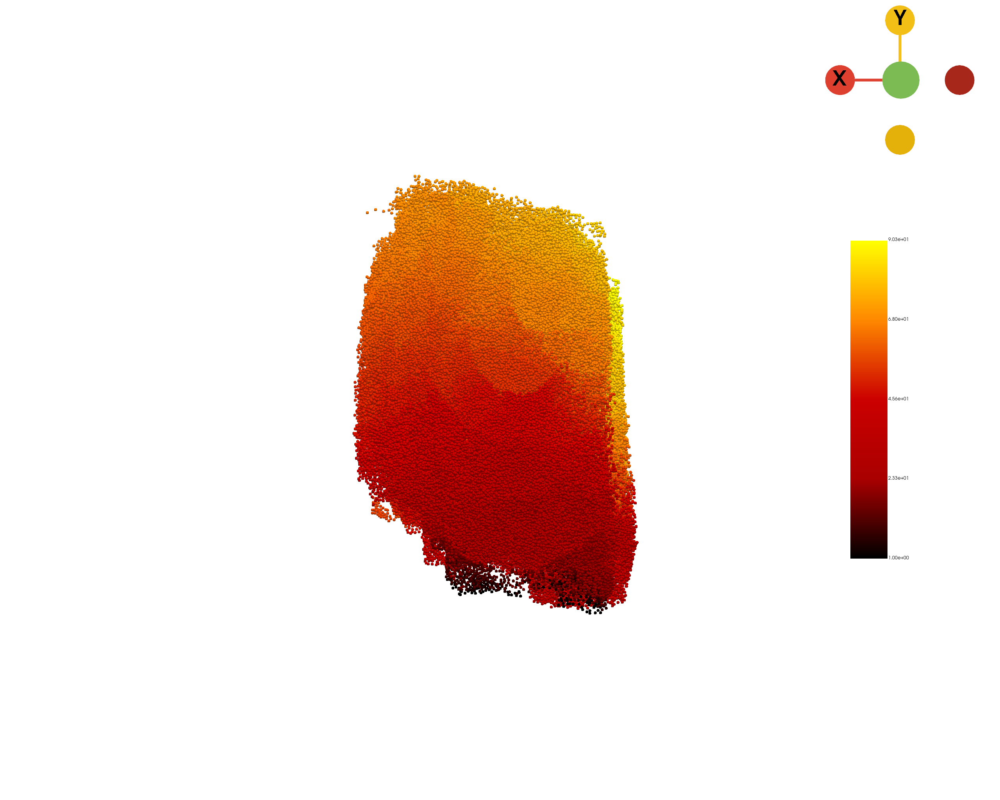

In [14]:
st.pl.three_d_plot(
    model = pc_model,
    key = "rc_coord",
    model_style ="points",
    model_size = 8,
    opacity = 1,
    colormap = "hot_y",
    show_legend = True,
    jupyter = "static",
    off_screen = False,
    cpo=[(1626, 481, -519), (1612, 481, 647), (0, 1, 0)],
    window_size = (2560, 2048),
    filename = "./analysis/figures/mouse_E11.5_ZLI_RC_coord.tiff"
)

In [15]:
# Load the mouse ligand:receptor (L:R) database- for the purpose of filtering out receptors from the targets list
lr_db = pd.read_csv("./database/lr_db_mouse.csv", index_col=0)

In [16]:
# Extract unique values from 'from' and 'to' columns
unique_l = lr_db['from'].unique().tolist()
unique_r = lr_db['to'].unique().tolist()

# Combine and remove duplicates
combined = set(unique_l + unique_r)

# Split elements containing '_'
split_elements = [item.split('_') for item in combined if '_' in item]
flat_list = [item for sublist in split_elements for item in sublist]

# Add split elements to combined set
combined.update(flat_list)

# Remove the elements containing '_' as they are already split
combined = {x for x in combined if '_' not in x}
print(len(combined))

unique_l = [item.split('_') for item in unique_l]
unique_l = set([item for sublist in unique_l for item in sublist])
unique_r = [item.split('_') for item in unique_r]
unique_r = set([item for sublist in unique_r for item in sublist])

1168


### GLM regression to identify axis-associated genes

In [ ]:
pos_rate = np.sum(e115_zli.X.A!=0,axis=0) / e115_zli.n_obs

In [ ]:
e115_zli = e115_zli[:, pos_rate > 0.01].copy()
e115_zli

In [ ]:
e115_zli.uns['pp'] = {}
dyn.pp.normalize_cell_expr_by_size_factors(e115_zli)

<div style="background-color: #D9EDF7; padding: 10px; border-radius: 5px;">
<b>Note:</b> The below step can be very time-consuming, especially for larger datasets, as is the case for our embryo data. For convenience, the dataframe returned by this will also be included in the Dropbox folder containing the embryo AnnData. In this case, the below block can be skipped over.
</div>

In [ ]:
dyn.tl.glm_degs(e115_zli, fullModelFormulaStr='~rc_coord')
e115_zli.uns['glm_degs'].to_csv("./analysis/zli_glm_deg_calibratedRC.csv")

In [17]:
if "glm_degs" not in e115_zli.uns_keys():
    e115_zli.uns['glm_degs'] = pd.read_csv("./analysis/zli_glm_deg_calibratedRC.csv", index_col=0)

Our approach will be to cluster the GLM DEGs; by examining co-clustering with the markers Shh (ZLI), Six3 (pre-thalamus/anterior to the ZLI), and Irx3 (thalamus/posterior to the ZLI), we can try to ensure a reasonable split of the representation in our targets list for the three regions. 

In [18]:
df = e115_zli.uns['glm_degs'].copy()
df = df.sort_values('pval',ascending=True)
df['gene'] = df.index.to_list()
df['pval'] = df['pval'].astype(np.float32)

In [19]:
glm_genes = df.loc[df['qval'] <= 1e-10,:].index.to_list()
len(glm_genes)

1200

In [20]:
# Look only at genes that are expressed in over 2% (arbitrarily chosen) of the cells in our AnnData object
n_cells_threshold = int(0.02 * e115_zli.n_obs)
gene_counts = np.array(np.sum(e115_zli.X > 0, axis=0).reshape(-1, 1))
gene_counts = gene_counts.flatten()
expressed_genes = e115_zli.var_names[gene_counts >= n_cells_threshold]
glm_genes = [g for g in glm_genes if g in expressed_genes]
len(glm_genes)

1030

In [21]:
exp_mtx = e115_zli.X.todense()
exp_mtx = pd.DataFrame(
    exp_mtx,
    index=e115_zli.obs.index,
    columns=e115_zli.var.index
)

In [22]:
# Shh is expressed along the floor plate as well as the ZLI- we would like only the portion that clusters with the ZLI along the R-C axis
exp_mtx.loc[e115_zli.obs["mapped_celltype"] != "Zona limitans intrathalamica", "Shh"] = 0
exp_mtx.loc[:, "Shh"].sum()

3440.0

In [23]:
exp_mtx["digital_column"] = e115_zli.obs["rc_coord"].astype(int).to_list()
agg_exp_column = exp_mtx.groupby(["digital_column"]).mean()
agg_exp_column = agg_exp_column.transpose().sort_index(axis=1)

In [24]:
from scipy.ndimage import gaussian_filter1d

agg_exp_column_tmp = agg_exp_column.iloc[:,16:].copy()


agg_exp_column_tmp = agg_exp_column_tmp.apply(
    lambda x: gaussian_filter1d(x, 3).tolist(),
    axis=1,
)
agg_exp_column_tmp = pd.DataFrame(
    agg_exp_column_tmp.to_list(),
    index=agg_exp_column.index,
    columns=agg_exp_column.columns[16:],
)

agg_exp_column_tmp = agg_exp_column_tmp.loc[glm_genes]
agg_exp_column_tmp = agg_exp_column_tmp.loc[agg_exp_column_tmp.idxmax(axis=1).sort_values().index]

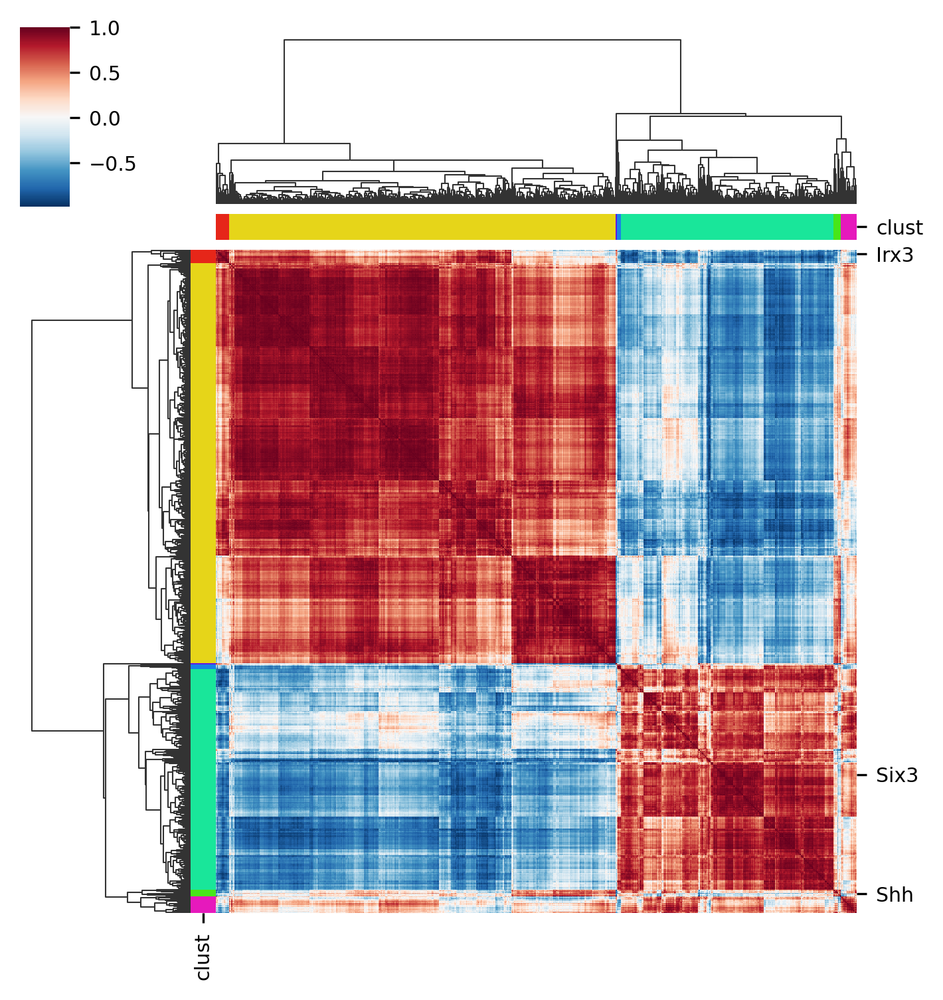

In [25]:
from scipy.cluster.hierarchy import fcluster, linkage
from scipy.spatial import distance

agg_exp_column_tmp_stand = ((agg_exp_column_tmp.T - agg_exp_column_tmp.T.min()) / (agg_exp_column_tmp.T.max() - agg_exp_column_tmp.T.min())).T
agg_exp_column_tmp_stand

correlations = agg_exp_column_tmp_stand.T.corr()
correlations_array = np.asarray(agg_exp_column_tmp_stand.T.corr())

row_linkage = linkage(
    distance.pdist(correlations_array), method='average')

correlations['clust'] = fcluster(row_linkage, criterion="maxclust",t=7)

pal = sns.hls_palette(len(set(correlations['clust'])), l=0.5, s=0.8)
np.random.shuffle(pal)
lut = dict(zip(set(correlations['clust']), pal))
row_colors = pd.DataFrame(correlations['clust'])['clust'].map(lut)


g = sns.clustermap(correlations.iloc[:,:-1],
                   row_linkage=row_linkage, col_linkage=row_linkage,
                   row_colors=row_colors, col_colors=row_colors,
                   method="average",figsize=(5, 5),
                   cmap="RdBu_r",
                   rasterized=True,xticklabels=False,
                  )


reordered_labels = agg_exp_column_tmp.index[g.dendrogram_col.reordered_ind].tolist()
# Change these to any genes based on preference
use_labels = ["Shh", "Irx3", "Six3"]
use_ticks = [reordered_labels.index(label) + .5 for label in use_labels]
g.ax_heatmap.set(yticks=use_ticks, yticklabels=use_labels)
plt.show(g)

In [26]:
correlations["clust"].value_counts()

2    621
5    342
7     26
1     21
6     11
4      7
3      2
Name: clust, dtype: int64

In [27]:
correlations.loc["Shh", "clust"]

6

In [28]:
correlations.loc["Irx3", "clust"]

1

In [29]:
correlations.loc["Six3", "clust"]

5

In [30]:
six3_clust = correlations.loc["Six3", "clust"]

From our approach here, the Shh and Irx3 clusters are small enough to use all genes from these clusters- we will also sort the top 20 most correlated with Six3 from the Six3 cluster.

In [31]:
targets = correlations[correlations["clust"].isin([1, 6])].index.tolist()
targets = [t for t in targets if "Rik" not in t and "mt-" not in t]
targets

['Ajuba',
 'Arl4a',
 'Shh',
 'Igfbp5',
 'Robo2',
 'Zfhx3',
 'Plcl1',
 'Slit2',
 'Rspo2',
 'Tpbg',
 'Ptprn2',
 'Hes5',
 'Neurog2',
 'Slc25a1',
 'Kif21a',
 'Neurog1',
 'Id2',
 'Mecom',
 'Gins2',
 'Hist1h1a',
 'Pdha1',
 'Dhx32',
 'Irx3',
 'Slbp',
 'Spsb4',
 'Thsd4',
 'Sox6',
 'Pcdh18',
 'Dcp2',
 'Tfdp2']

In [32]:
six3_clust_genes = correlations[correlations["clust"] == six3_clust]
six3_clust_genes = six3_clust_genes.drop("clust", axis=1)
six3_clust_genes_corr = six3_clust_genes.loc["Six3"]
six3_clust_genes_corr

Cacna2d1   -0.052624
Nrn1        0.089238
Epha3       0.852505
Cst3        0.645619
Cpe         0.339569
              ...   
Cenpe      -0.633224
Tfdp1      -0.591653
Wnk1       -0.678459
Psmd1      -0.557418
Gli3       -0.799060
Name: Six3, Length: 1030, dtype: float64

In [33]:
top_20 = six3_clust_genes_corr.sort_values(ascending=False).head(20).index.tolist()
top_20

['Six3',
 'Arx',
 'Dlx1',
 'Dlx2',
 'Dlx5',
 'Gad2',
 'Nrxn3',
 'Gm29683',
 'Ascl1',
 'Dlk1',
 'Celf2',
 'Peg10',
 'Dlx1as',
 'Dpp6',
 'Scrn1',
 'Slc25a12',
 'Wnt7b',
 'Meg3',
 'Usmg5',
 'Ubb']

In [34]:
targets = targets + top_20
targets = list(set(targets))
targets = [t for t in targets if t not in unique_r]
len(targets)

49

In [35]:
if not os.path.exists("./analysis/CCI_inputs"):
    os.mkdir("./analysis/CCI_inputs")

In [36]:
with open("./analysis/CCI_inputs/zli_targets_tutorial.txt", "w") as file:
    for item in targets:
        file.write("%s\n" % item)

<div style="background-color: #D9EDF7; padding: 10px; border-radius: 5px;">
<b>Note:</b> We have also included a separate list of targets in the Dropbox folder where the data was downloaded from. This was used in our prior analysis of this data and will be used in the modeling notebook to follow. The genes from this list were compiled from a combination of this approach and checking for biological functions. 
</div>

### Visualization of expression of selected target genes

To verify our selections, we can visualize the spatial patterns of gene expression, to make sure potential targets are expressed in sufficient quantities of cells, that they are in particular regions which may be of interest, etc. 

In [37]:
from typing import Optional, Tuple, Union

import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
from pyvista import PolyData, UnstructuredGrid

try:
    from typing import Literal
except ImportError:
    from typing_extensions import Literal


def add_model_labels(
        model: Union[PolyData, UnstructuredGrid],
        labels: np.ndarray,
        key_added: str = "groups",
        where: Literal["point_data", "cell_data"] = "cell_data",
        colormap: Union[str, list, dict, np.ndarray] = "rainbow",
        alphamap: Union[float, list, dict, np.ndarray] = 1.0,
        mask_color: Optional[str] = "gainsboro",
        mask_alpha: Optional[float] = 0.0,
        inplace: bool = False,
) -> Tuple[Optional[PolyData or UnstructuredGrid], Optional[Union[str]]]:
    model = model.copy() if not inplace else model
    labels = np.asarray(labels).flatten()

    cu_arr = np.sort(np.unique(labels), axis=0).astype(object)
    raw_labels_hex = labels.copy().astype(object)
    raw_labels_alpha = labels.copy().astype(object)
    raw_labels_hex[raw_labels_hex == "mask"] = mpl.colors.to_hex(mask_color)
    raw_labels_alpha[raw_labels_alpha == "mask"] = mask_alpha

    # Set raw hex.
    if isinstance(colormap, str):
        if colormap in list(mpl.colormaps()):
            lscmap = mpl.cm.get_cmap(colormap)
            raw_hex_list = [mpl.colors.to_hex(lscmap(i)) for i in np.linspace(0, 1, len(cu_arr))]
            for label, color in zip(cu_arr, raw_hex_list):
                raw_labels_hex[raw_labels_hex == label] = color
        else:
            raw_labels_hex[raw_labels_hex != "mask"] = mpl.colors.to_hex(colormap)
    elif isinstance(colormap, dict):
        for label, color in colormap.items():
            raw_labels_hex[raw_labels_hex == label] = mpl.colors.to_hex(color)
    elif isinstance(colormap, list) or isinstance(colormap, np.ndarray):
        raw_hex_list = np.array([mpl.colors.to_hex(color) for color in colormap]).astype(object)
        for label, color in zip(cu_arr, raw_hex_list):
            raw_labels_hex[raw_labels_hex == label] = color
    else:
        raise ValueError("`colormap` value is wrong." "\nAvailable `colormap` types are: `str`, `list` and `dict`.")

    # Set raw alpha.
    if isinstance(alphamap, float) or isinstance(alphamap, int):
        raw_labels_alpha[raw_labels_alpha != "mask"] = alphamap
    elif isinstance(alphamap, dict):
        for label, alpha in alphamap.items():
            raw_labels_alpha[raw_labels_alpha == label] = alpha
    elif isinstance(alphamap, list) or isinstance(alphamap, np.ndarray):
        raw_labels_alpha = np.asarray(alphamap).astype(object)
    else:
        raise ValueError(
            "`alphamap` value is wrong." "\nAvailable `alphamap` types are: `float`, `list` and `dict`."
        )

    # Set rgba.
    labels_rgba = [mpl.colors.to_rgba(c, alpha=a) for c, a in zip(raw_labels_hex, raw_labels_alpha)]
    labels_rgba = np.array(labels_rgba).astype(np.float32)

    # Added rgba of the labels.
    if where == "point_data":
        model.point_data[f"{key_added}_rgba"] = labels_rgba
    else:
        model.cell_data[f"{key_added}_rgba"] = labels_rgba

    plot_cmap = None

    # Added labels.
    if where == "point_data":
        model.point_data[key_added] = labels
    else:
        model.cell_data[key_added] = labels

    return model if not inplace else None, plot_cmap

In [38]:
gene = "Rspo2"

In [39]:
pc_model, _ = st.tdr.construct_pc(
    adata = e115_zli,
    spatial_key = "z_correction",
    groupby = gene,
    key_added = gene, 
    colormap = "Reds"
)

pc_model = st.tdr.rotate_model(model=pc_model, angle=(0, 0, 90), rotate_center= pc_model.center, inplace=False)
pc_model = st.tdr.rotate_model(model=pc_model, angle=(0, 180, 0), rotate_center= pc_model.center, inplace=False)
pc_model = st.tdr.rotate_model(model=pc_model, angle=(30, 0, 0), rotate_center= pc_model.center, inplace=False)

In [40]:
pc_index = pc_model.point_data["obs_index"].tolist()
exp = e115_zli[pc_index, gene].X.A.flatten()
exp[exp <= 0] = 0
p_cutoff = np.percentile(exp, 99.5)
exp[exp > p_cutoff] = p_cutoff

amap = exp.copy()
amap = amap / np.max(amap)
amap[amap <= 0.5] = 0.1
add_model_labels(
    model = pc_model, 
    labels = exp, 
    key_added = gene, 
    alphamap = amap, 
    where = "point_data",
    inplace = True, 
    colormap = "Reds"
)

(None, None)

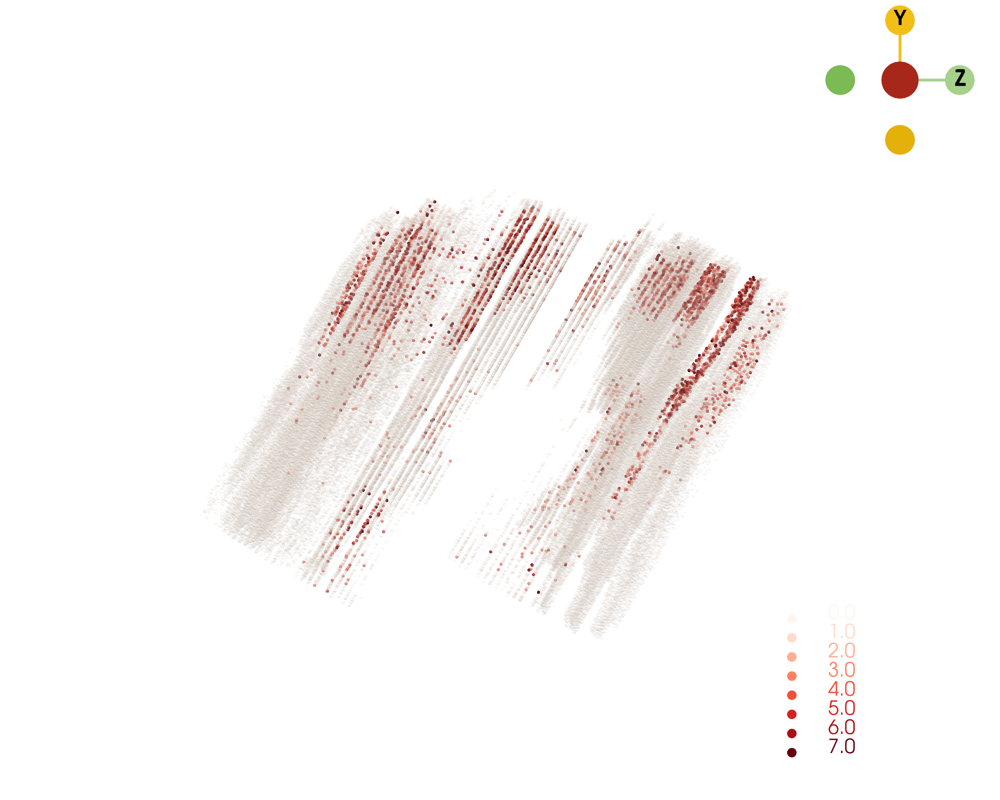

In [41]:
st.pl.three_d_plot(
    model = pc_model,
    key = gene,
    model_style = "points",
    model_size = 8,
    opacity = 1,
    colormap = None,
    show_legend = True,
    jupyter = "static",
    off_screen = False,
    cpo = "zy",
    window_size = (2560, 2048),
    filename = f"./analysis/figures/mouse_E11.5_ZLI_{gene}.tiff"
)

## Create list(s) of signaling molecules for model

<div style="background-color: #D9EDF7; padding: 10px; border-radius: 5px;">
<b>Note:</b> Although this tutorial will filter to sets of both ligands and receptors, in the modeling portion only the list of ligands will be used- for scenarios in which data is sparser (as is the case for our embryo data), this is recommended. In these scenarios, receptor selection can be skipped over, but we demonstrate it for other cases where it may be more applicable. 
</div>

In [42]:
combined_sub = [g for g in combined if g in e115_zli.var_names]
print(len(combined_sub))

unique_l = [g for g in unique_l if g in e115_zli.var_names]
print(len(unique_l))

unique_r = [g for g in unique_r if g in e115_zli.var_names]
print(len(unique_r))

901
443
495


In [43]:
df_expression = pd.DataFrame(e115_zli[:, combined_sub].X.toarray(), index=e115_zli.obs_names, columns=combined_sub)

In [44]:
# Save ligands and receptors expressed in over n cells:
n = 2000
gene_counts = (df_expression > 0).sum()

# Filter ligands and receptors
expressed_ligands = gene_counts[unique_l][gene_counts > n].index.tolist()
expressed_receptors = gene_counts[unique_r][gene_counts > n].index.tolist()

len(expressed_ligands), len(expressed_receptors)

(72, 95)

In [45]:
if not os.path.exists("./analysis/CCI_inputs"):
    os.mkdir("./analysis/CCI_inputs")

In [46]:
with open("./analysis/CCI_inputs/zli_ligands.txt", "w") as file:
    for item in expressed_ligands:
        file.write("%s\n" % item)

In [47]:
with open("./analysis/CCI_inputs/zli_receptors.txt", "w") as file:
    for item in expressed_receptors:
        file.write("%s\n" % item)